THIS NOTEBOOK IS FOR VISUALIZING ALREADY PRE-TRAINED MODEL in '../weights/nmr_500000.pth'  for Eiffel Tower AND TRAINED FOR SOME EPOCHS WITH MODEL SAVED IN "../weights/image/model_500500.pth"
1. To run for rendering "python gen_real.py --config configs/[redner_config_required]"
2. To train the mode "python train.py --config configs/[train_config]"


In [2]:
# import the training function
# The train function is modified from the original train.py to handle our 
# requirements

from train import train
from argparse import Namespace

/home/samundra/.conda/envs/visionnerf/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# defining the render_params and train_config
render_params_no_training = Namespace(config='./configs/render_real.txt', 
          expname="eiffel_without_training", 
          ckptdir="./experiment/without_training", 
          ckpt_path="./weights/nmr_500000.pth",
          outdir="./experiment/without_training",
          local_rank=0, 
          data_path="./experiment/train_eiffel",
          img_hw=[128, 128], focal=200.0, radius=1.3, data_index=[1], z_near=0.8, z_far=1.8, 
          fps=12, no_reload=False, distributed=False, num_frames=40, elevation=0.0, 
          chunk_size=2048, im_feat_dim=512, mlp_feat_dim=512, freq_num=10, mlp_block_num=6, 
          coarse_only=False, anti_alias_pooling=1, num_source_views=1,
          freeze_pos_embed=False, no_skip_conv=False, lrate_feature=0.001, 
          lrate_mlp=0.0005, lrate_decay_factor=0.5, lrate_decay_steps=50000, 
          warmup_steps=10000, scheduler='steplr', use_warmup=False, bbox_steps=100000, 
          N_samples=64, N_importance=128, inv_uniform=False, det=False, white_bkgd=True)


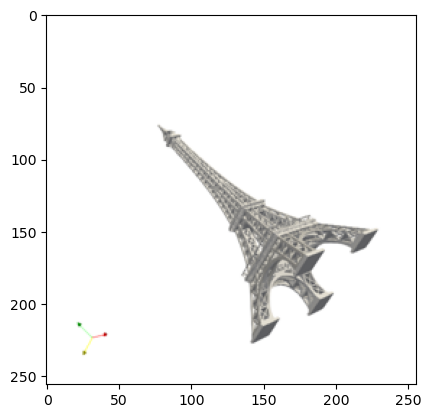

In [4]:
# display the image used to render without training, go to the data path and display the image which has *normalize.png
# in the name
# get the image path
from glob import glob
import os
import numpy as np
import matplotlib.pyplot as plt

# get the image path
img_path = glob(os.path.join(render_params_no_training.data_path, "*normalize.png"))[0]
# read the image
img = plt.imread(img_path)
# display the image
plt.imshow(img)

In [ ]:
# render the image
from gen_real import gen_video
# from opt import config_parser

# The function is prepared to generate poses and intrinsics for the images
# You can use this or run the function in GPU 
gen_video(render_params_no_training)



VISUALIZING WITHOUT TRAINING

In [6]:
import math
# as we are processing the function in GPU for 512 x 512 image, we pull the generated image directly from the GPU
# go to outdir and display the image which has *render.png in the name
# get all the images from the outdir
print(os.path.join(render_params_no_training.outdir,render_params_no_training.expname))

img_path = glob(os.path.join(render_params_no_training.outdir,render_params_no_training.expname,"000000","*.png"))
# num_images = len(img_path)
num_images=20
img_path=img_path[:num_images]
cols = 5 # Adjust as needed
rows = math.ceil(num_images / cols)

# Create the subplots
fig, axs = plt.subplots(rows, cols, figsize=(100, 100))  # Adjust the figure size as needed

# Flatten the axes array if there's more than one row
if rows > 1:
    axs = axs.flatten()

# Loop over the images and display them in the subplots
for i, path in enumerate(img_path):
    img = plt.imread(path)
    axs[i].imshow(img)
    axs[i].axis('off')  # Hide the axes
    

# If there are fewer images than subplots, hide the extra subplots
for i in range(num_images, rows*cols):
    axs[i].axis('off')

plt.show()

./experiment/without_training/eiffel_without_training


TRAINING THE MODEL IS DIFFICULT TASK WE HAVE PRETRAIN  MODEL BUT WE NEED TO CREATE DATA SET SUITABLE TO WORK IN THE GIVEN FRAMEWORK
WE USE THE CODE "extract_camera.py" to get the views as present in here


GENERATING TRAINING VIEWS

In [7]:
params_for_training = Namespace(config='./configs/render_real.txt', 
          expname="image", 
          ckptdir="./configs/weights", 
          ckpt_path="./weights/nmr_500000.pth",
          local_rank=0, 
          data_path="./train_eiffel",
          img_hw=[128, 128], focal=200.0, radius=1.3, data_index=[1], z_near=0.8, z_far=1.8, 
          fps=12, no_reload=False, distributed=False, num_frames=40, elevation=0.0, 
          chunk_size=2048, im_feat_dim=512, mlp_feat_dim=512, freq_num=10, mlp_block_num=6, 
          coarse_only=False, anti_alias_pooling=1, num_source_views=1,
          freeze_pos_embed=False, no_skip_conv=False, lrate_feature=0.001, 
          lrate_mlp=0.0005, lrate_decay_factor=0.5, lrate_decay_steps=50000, 
          warmup_steps=10000, scheduler='steplr', use_warmup=False, bbox_steps=100000, 
          N_samples=64, N_importance=128, inv_uniform=False, det=False, white_bkgd=True)
path = "./train_eiffel/eiffel/eiffels/image"
# extract the images from the path
img_path = glob(os.path.join(path,"*.png"))
num_images = len(img_path)
cols = 10  # Adjust as needed
rows = math.ceil(num_images / cols)

# Create the subplots
fig, axs = plt.subplots(rows, cols, figsize=(100, 100))  # Adjust the figure size as needed

# Flatten the axes array if there's more than one row
if rows > 1:
    axs = axs.flatten()

# Loop over the images and display them in the subplots
for i, path in enumerate(img_path):
    img = plt.imread(path)
    axs[i].imshow(img)
    axs[i].axis('off')  # Hide the axes

# If there are fewer images than subplots, hide the extra subplots
for i in range(num_images, rows*cols):
    axs[i].axis('off')
plt.subplots_adjust(wspace=0.001, hspace=0.001)
plt.show()

DUE TO THE SIZE OF THE MODEL MODEL IS TRAINED WITH A100 GPU IN NOVA
USE THE FOLLOWING COMMAND TO TRAIN THE MODEL:
"python train.py --config configs/train_nmr.txt"
The input images for training are saved in "train_eiffel/eiffels/image/image_0*.png"
The folder needs to have "cameras.npz" which will include all the extrinsics for the input images
The *.lst files are necessary for training

In [8]:
with open('configs/render_real_after_train.txt', 'r') as file:
    contents = file.read()
print(contents)
render_params_with_training = Namespace(
    expname="eiffel_with_training",
    ckptdir="./experiment",
    ckpt_path="./weights/image/model_500500.pth",
    data_path="./experiment/train_eiffel",
    outdir="./experiment",
    img_hw=[512, 512],
    chunk_size=8192,
    mlp_block_num=6,
    white_bkgd=True,
    im_feat_dim=512,
    focal=50,
    radius=1
)

expname = eiffel_with_training
ckptdir = /work/mech-ai-scratch/samundra/experiments/ee526/vision-nerf-dissection/experiment
ckpt_path = /work/mech-ai-scratch/samundra/experiments/ee526/vision-nerf-dissection/weights/image/model_500500.pth
data_path = /work/mech-ai-scratch/samundra/experiments/ee526/vision-nerf-dissection/experiment/train_eiffel
outdir = /work/mech-ai-scratch/samundra/experiments/ee526/vision-nerf-dissection/experiment
img_hw = [256, 256]
chunk_size = 16384 # Increase this if you have large GPU memory
mlp_block_num = 6
white_bkgd = True
im_feat_dim = 512
focal= 40
radius= 1


VISUALIZING AFTER TRAINING FOR 5 EPOCHS

In [9]:
# Let's extract the images from the path 
print(os.path.join(render_params_with_training.outdir,render_params_with_training.expname))

img_path = glob(os.path.join(render_params_with_training.outdir,render_params_with_training.expname,"000000","*.png"))
# num_images = len(img_path)
num_images=20
img_path=img_path[:num_images]
cols = 5 # Adjust as needed
rows = math.ceil(num_images / cols)

# Create the subplots
fig, axs = plt.subplots(rows, cols, figsize=(100, 100))  # Adjust the figure size as needed

# Flatten the axes array if there's more than one row
if rows > 1:
    axs = axs.flatten()

# Loop over the images and display them in the subplots
for i, path in enumerate(img_path):
    img = plt.imread(path)
    axs[i].imshow(img)
    axs[i].axis('off')  # Hide the axes
    

# If there are fewer images than subplots, hide the extra subplots
for i in range(num_images, rows*cols):
    axs[i].axis('off')

plt.show()

./experiment/eiffel_with_training


RUNNING WITH PRETRAINED MODEL FOR 5 UNSEEN CATEGORIES

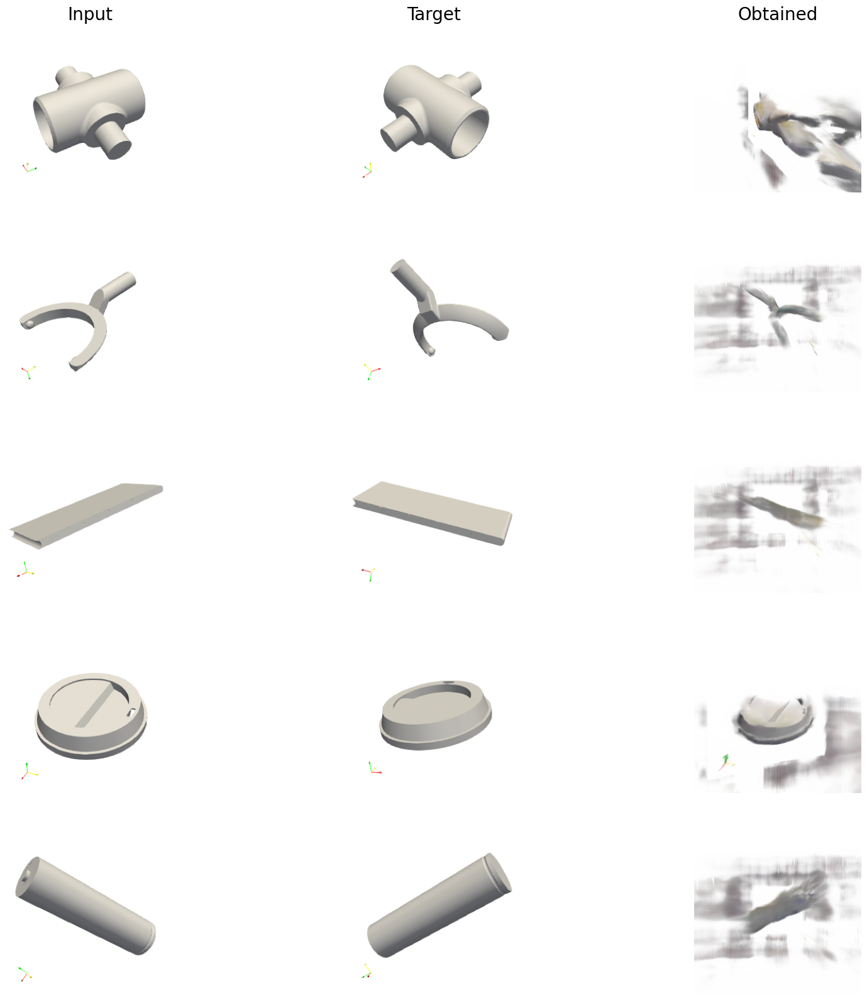

In [10]:
import matplotlib.pyplot as plt
from glob import glob

# Define the path and the image names
path = "./experiment/without_training/unseen_without_training/comparison"
image_sets = [[f"input {i}.png", f"target {i}.png", f"image {i}.png"] for i in range(5)]
column_titles = ["Input", "Target", "Obtained"]

# Create a figure and axes for the subplots
fig, axs = plt.subplots(len(image_sets), 3, figsize=(20, 20))

# Set the column titles
for ax, col in zip(axs[0], column_titles):
    ax.set_title(col,fontsize=20)

# Loop over the image sets
for i, image_set in enumerate(image_sets):
    # Loop over the images in the set
    for j, image_name in enumerate(image_set):
        # Construct the full image path
        image_path = os.path.join(path, image_name)
        
        # Read and display the image
        img = plt.imread(image_path)
        axs[i, j].imshow(img)
        axs[i, j].axis('off')  # Hide the axes

plt.show()